# Scenario analysis

An essential feature of a model is that when given a specific set of inputs (the exogenous variables to the model) it will always return the same results. 

Below a new `ModelFlow` sessionis prepared, initializing a pandas session and importing and solving a saved WBG model (NB: these are precisely the same commands they used to start the previous chapter) and would form the essential initialization commands of any python session using `ModelFlow`.


In [3]:
# import the model class from modelflow package
from modelclass import model 
import modelmf       # Add useful features to pandas dataframes 
                     # using utlities initially developed for modelflow

model.widescreen()   # These modelflow commands ensure that outputs from modelflow play well with Jupyter Notebook
model.scroll_off()

%load_ext autoreload   
%autoreload 2


#Load a saved version of the Pakistan model and solve it, 
#saving the results in the model object mpak, and the resulting dataframe in bline

#Replace the path below with the location of the pak.pcim file on your computer
mpak,bline = model.modelload('C:\mflow\modelflow-manual\papers\mfbook\content\models\pak.pcim', \
                                alfa=0.7,run=1,keep= 'Baseline')



file read:  C:\mflow\modelflow-manual\papers\mfbook\content\models\pak.pcim


:::{Recall}
The ```model``` object (```mpak``` in this instance) always contains two `DataFrames`, the `.basedf` dataframe that contains the initial values for the variables of the model, and the `.lastdf` which contain the results of the most recently executed scenario.
:::

As noted, when the model is solved without changing any inputs (as was the case of the load) the model should return (reproduce) exactly the same data as before[^fn2].  To test this for ```mpak``` the results from the simulation can be compared by using the ```basedf``` and ```lastdf``` DataFrames.

[^fn2:] If it does not, the model has violated he principle of reproducibility and there is something wrong (usually one of the identities does not hold).


Below, the percent difference between the values of the variables for real GDP and Consumer demand in the two `dataframes` `.basedf` and `lastdf` is zero following a simulation where the inputs were not changed -- confirming the reproduction of results.


In [4]:
# Need statement to change the default format
mpak.smpl(2020,2030)
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN'].difpctlevel.mul100.df


,PAKNYGDPMKTPKN,PAKNECONPRVTKN
2020,0.0,0.0
2021,0.0,0.0
2022,0.0,0.0
2023,0.0,0.0
2024,0.0,0.0
2025,0.0,0.0
2026,0.0,0.0
2027,0.0,0.0
2028,0.0,0.0
2029,0.0,0.0


## Different kinds of simulations

The `modelflow` package performs 4 different kinds of simulation:

1. A shock to an exogenous variable in the model
2. An exogenous shock of a behavioural variable, executed by exogenizing the variable
3. An endogenous shock of a behavioural variable, executed by shocking the add factor of the variable.
4. A mixed shock of a behavioural variable, achieved by temporarily exogenixing the variable.

Although technically modelflow would allow us to shock identities, that would violate their nature as accounting rules. **Effectively such a shock would break the economic sense of the model.** 

As a result, this we possibility is not discussed. 


### A shock to an exogenous variable

A World Bank model will reproduce the same values if inputs (exogenous variables) are not changed.  In the simulation below, the oil price is changed -- increasing by $25 for the three years between 2025 and 2027 inclusive.

As a first step a new input dataframe is created as a copy of the original and then the oil price in that data frame is modified using the `mfcalc` method to change the value for the three years in question.

Finally pandas math is used to display the initial value, the changed value and the difference between the two, confirming that the mfcalc statement revised the oil price data.

In [5]:
#Make a copy of the baseline dataframe
oilshockdf=mpak.basedf
oilshockdf=oilshockdf.mfcalc("<2025 2027> WLDFCRUDE_PETRO = WLDFCRUDE_PETRO +25")

compdf=mpak.basedf.loc[2000:2030,['WLDFCRUDE_PETRO']]
compdf['LASTDF']=oilshockdf.loc[2000:2030,['WLDFCRUDE_PETRO']]
compdf['Dif']=compdf['LASTDF']-compdf['WLDFCRUDE_PETRO']

compdf.loc[2024:2030]



,WLDFCRUDE_PETRO,LASTDF,Dif
2024,80.367180,80.367180,0.0
2025,85.336809,110.336809,25.0
2026,90.613742,115.613742,25.0
2027,96.216983,121.216983,25.0
2028,102.166709,102.166709,0.0
2029,108.484346,108.484346,0.0
2030,115.192643,115.192643,0.0


#### Running the simulation

Having created a new dataframe comprised of all the old data plus the changed data for the oil price, a simulation can now be run.  

In the command below, the simulation is run from 2020 to 2040, using the `oilshockdf` as the input `DataFrame`.  The results of the simulation are assigned to a new `DataFrame`  named `ExogOilSimul`.  The `Keep` command ensures that the mpak model object stores (keeps) a copy of the results identified by the text name *'$25 increase in oil prices 2025-27'*.

In [6]:
#Simulate the model 
ExogOilSimul = mpak(oilshockdf,2020,2040,keep='$25 increase in oil prices 2025-27') 



##### Results

`ModelFlow` tools can be used to visualize the impacts of the shock; as a print out; as charts and within Jupyter notebook as an interactive widget.

The display below confirms that the shock was executed as desired. The `dif.df` method returns the difference between the `.lastdf` and `.basedf` values of the selected variable(s) as a `DataFrame`. The `with mpak.set_smpl(2020,2030):` clause temporarily restricts the sample period over which the following **indented** commands are executed.  

Alternatively the `mpak.smpl(2020,2030)`could be used. This would restricts the time period of over which **all** subsequent commands are executed.


In [7]:
with mpak.set_smpl(2020,2030):
    print(mpak['WLDFCRUDE_PETRO'].dif.df);

      WLDFCRUDE_PETRO
2020              0.0
2021              0.0
2022              0.0
2023              0.0
2024              0.0
2025             25.0
2026             25.0
2027             25.0
2028              0.0
2029              0.0
2030              0.0


Below the impact of this change on a few variables are expressed graphically and in a table.

The first variable ```PAKNYGDPMKTPKN``` is Pakistan's real GDP, the second ```PAKNECONPRVTKN``` is real consumption and the third is the Consumer price deflator ```PAKNECONPRVTXN```.



C:\Users\wb268970\.conda\envs\mf_pinned_developement_test\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.canvas.print_figure(bytes_io, **kw)


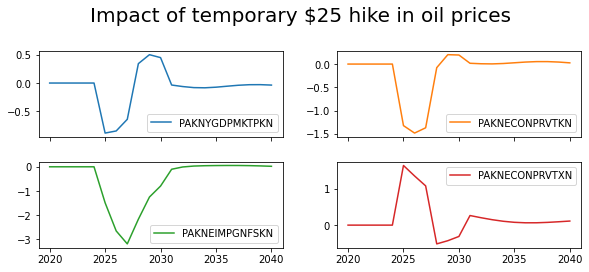

In [8]:
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEIMPGNFSKN PAKNECONPRVTXN'].difpctlevel.mul100.plot(title="Impact of temporary $25 hike in oil prices")

In [9]:

print(round(mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEIMPGNFSKN PAKNECONPRVTXN'].difpctlevel.mul100.df,2))

      PAKNYGDPMKTPKN  PAKNECONPRVTKN  PAKNEIMPGNFSKN  PAKNECONPRVTXN
2020            0.00            0.00            0.00            0.00
2021            0.00            0.00            0.00            0.00
2022            0.00            0.00            0.00            0.00
2023            0.00            0.00            0.00            0.00
2024            0.00            0.00            0.00            0.00
2025           -0.89           -1.32           -1.49            1.64
2026           -0.85           -1.48           -2.65            1.35
2027           -0.64           -1.37           -3.19            1.08
2028            0.34           -0.08           -2.17           -0.51
2029            0.50            0.20           -1.25           -0.43
2030            0.45            0.19           -0.80           -0.31
2031           -0.04            0.02           -0.10            0.26
2032           -0.06            0.01           -0.01            0.20
2033           -0.08            0.


The graphs show the change in the level as a percent of the previous level. They suggest that a temporary $25 oil price hike would reduce GDP in the first year by about 0.9 percent, that the impact would diminish by the third year to -.64 percent, and then turn positive in the fourth year when the price effect was eliminated.

The impacts on household consumption are stronger but follow a similar pattern.  

The GDP impact is smaller partly because the decline in domestic demand reduces imports.  Because imports enter into the GDP identity with a negative sign. Therefore a reduction in imports actually increase aggregate GDP -- or in this case partially offsets the declines coming from reduced consumption (and investment).

Finally as could be expected, initially prices rise sharply with higher oil prices. However, as the slow down in growth is felt, inflationary pressures turn negative and the overall impact on the price level turns negative.  The graph and table above shows what is happening to the **price level**. To see the impact on inflation (the rate of growth of prices), a separate graph can be generated using ```difpct.mul100```, which shows the change in the rate of growth of variables where the growth rate is expressed as a per cent $\bigg[\bigg(\frac{x^{shock}_t}{x^{shock}_{t-1}}-1\bigg)$ $ - \bigg(\frac{x^{baseline}_t}{x^{baseline}_{t-1}}-1\bigg)\Bigg]*100$. 

C:\Users\wb268970\.conda\envs\mf_pinned_developement_test\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.canvas.print_figure(bytes_io, **kw)


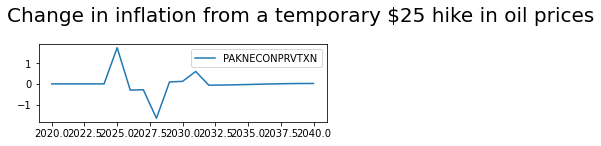

In [10]:
mpak['PAKNECONPRVTXN'].difpct.mul100.plot(title="Change in inflation from a temporary $25 hike in oil prices")

<span style="color:blue"> Ib how come this graph shows up so small.  How can we affect its size?</span>
    
This view, gives a more nuanced result.  The inflation rate increases initially by about 1.2 percentage points, but falls compared with the baseline below in the 2026-2027 period as the as the influence of the slowdown in GDP more than offsets the continued inflationary impetus from the lagged increase in oil prices. In 2028, when oil prices drop back to their previous level, there is an additional dis-inflationary force and sharp drop in inflation as compared with the baseline. Overtime, the boost to demand from lower prices translates into an acceleration in growth and a return of inflation back to its trend rate.



### An exogenous shock to a Behavioural variable 

Behavioural equations can be de-activated by exogenizing them, either for the entire simulation period, or for a selected sub period.  In this example, consumption is exogenized for the entire simulation period. 

To motivate the simulation, it is assumed that a change in weather patterns has increased the number of sunny days by 10 percent. This increases households happiness and causes them to permanently increase their spending by 2.5% beginning in 2025.

Such a shock can be specified either manually or by using the`.fix()` method. Below the simpler `.fix()` method is used, but the equivalent manual steps performed by `.fix()` are also explained.

To exogenize `PAKNECONPRVTKN` for the entire simulation period, initially a new `DataFrame` `Cfixed` is created as a slightly modified version of  `mpak.basedf` using the `.fix()` command.

`Cfixed=mpak.fix(mpak.basedf,PAKNECONPRVTKN)`

This does two things, that could have been done manually.  First it sets the dummy variable `PAKNECONPRVTKN_D=1` for the entire simulation period. Recall the consumption equation like all behavioural equations of World Banjk models implemented in `ModelFlow`is expressed in tow parts.


$$ cons= (1-cons_D)*\bigg[C'(X)\bigg] + cons_d*cons_x$$

When $cons_D=1$ the first part (as it does in this scenario) the equation evaluate to zero and consumption is equal to (1)* $cons_x$.  If instead (which would be the normal case $cons_d$ were set to zero. the the equation would simplify to $ cons= C'(X) $



Then `.fix()` method then sets the variable ```PAKNECONPRVTKN_X``` in the ```Cfixed``` dataframe equal to the value of ```PAKNECONPRVTKN``` in the ```basedf``` `.DataFrame`. All the other variables are  just copies of their values in `.basedf`.

With `PAKNECONPRVTKN_D=1` throughout the normal behavioral equation is effectively de-activated or exogenized ... $PAKNECONPRVTKN=PAKNECONPRVTKN_X$.



In [11]:
mpak.smpl() # reset the active sample period to the full model.
Cfixed=mpak.fix(bline,'PAKNECONPRVTKN')

For the moment, the equation is exogenized but the values have been set to the same values as the ```.basedf``` dataframe, so solving the model will not change anything.

The `.upd()` method can be used to implement the assumption that Real consumption (` PAKNECONPRVTYKN`) would be 2.5% stronger.


In [12]:
Cfixed=Cfixed.upd("<2025 2040> PAKNECONPRVTKN_X  * 1.025")

To perform the simulation, the revised `CFixed` DataFrame is input to the `mpak` model solve routine.

`CFixedRes = mpak(Cfixed,2020,2040,keep='2.5% increase in C 2025-40 (fix)')`

And then the results can be examined graphically as before.

C:\Users\wb268970\.conda\envs\mf_pinned_developement_test\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.canvas.print_figure(bytes_io, **kw)


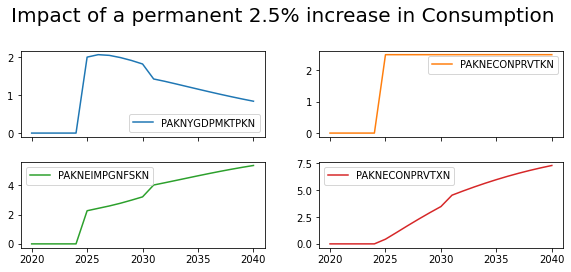

In [13]:
CFixedRes = mpak(Cfixed,2020,2040,keep='2.5% increase in C 2025-40') # simulates the model 
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEIMPGNFSKN PAKNECONPRVTXN'].difpctlevel.mul100.plot(title="Impact of a permanent 2.5% increase in Consumption")


In [14]:
import pandas as pd
with pd.option_context('display.float_format', '{:,.2f}'.format):
    with mpak.set_smpl(2020,2040):
        print(mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEIMPGNFSKN PAKNECONPRVTXN'].difpctlevel.mul100.df)


      PAKNYGDPMKTPKN  PAKNECONPRVTKN  PAKNEIMPGNFSKN  PAKNECONPRVTXN
2020            0.00            0.00            0.00            0.00
2021            0.00            0.00            0.00            0.00
2022            0.00            0.00            0.00            0.00
2023            0.00            0.00            0.00            0.00
2024            0.00            0.00            0.00            0.00
2025            2.01            2.50            2.27            0.44
2026            2.07            2.50            2.43            1.06
2027            2.05            2.50            2.59            1.69
2028            1.99            2.50            2.78            2.31
2029            1.92            2.50            2.99            2.90
2030            1.83            2.50            3.22            3.47
2031            1.43            2.50            4.03            4.53
2032            1.37            2.50            4.18            4.92
2033            1.30            2.

The permanent rise in consumption by 2.5 percent causes a temporary increase in GDP of close to 2% (1.86). Higher imports tend to diminish the effect on GDP. Over time higher prices due to the inflationary pressures caused by the additional demand cause the GDP impact to diminish to close to less than 1 percent by 2040. 

### Temporarily exogenize a behavioural variable

The third method of formulating a scenario involves temporarily exogenizing a variable. The methodology is the same except the period for which the variable is exogenized is different. 

Here the set up is basically the same as before.



C:\Users\wb268970\.conda\envs\mf_pinned_developement_test\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.canvas.print_figure(bytes_io, **kw)


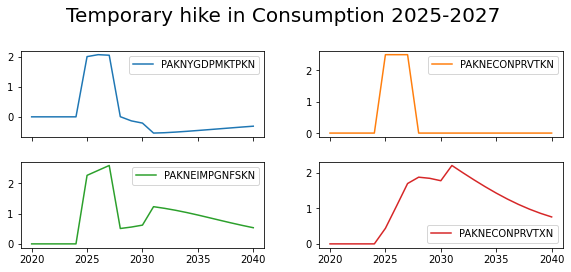

In [15]:
#reset the active sample period to the full period
mpak.smpl()                                  
# create a copy of the bline DataFrame, but setting the PAKNECONPRVTKN_D variable to 1 for the period 2025 through 2027
CTempExogAll=mpak.fix(bline,'PAKNECONPRVTKN') 
# multiply the exogenized value of consumption by 2.5% for 2025 through 2027
CTempExogAll=CTempExogAll.upd("<2025 2027> PAKNECONPRVTKN_X * 1.025")  

#Solve the model
CTempXAllRes = mpak(CTempExogAll,2020,2040,keep='2.5% increase in C 2025-27 -- exog whole period') # simulates the model 
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEIMPGNFSKN PAKNECONPRVTXN'].difpctlevel.mul100.plot(title="Temporary hike in Consumption 2025-2027")



The results are quite different.  GDP is boosted initially as before but when consumption drops back to its pre-shock level, GDP and imports decline sharply.

Prices (and inflation) are higher initially but when the economy starts to slow after 2025 prices actually fall (deflation). While prices are falling, the level of prices remains higher at the end of the simulation.



#### Temporary shock exogenized for the whole period

This scenario is the same as the previous, but this time the `--KG` (keep_growth) option is used to maintain the pre-shock growth rates of consumption in the post-shock period.  Effectively this is the same as a permanent increase in the level of consumption by 2.5% because the final shocked value of consumption (which was 2.5% higher then its pre-shock level) is grown at the same pre-shock rate -- ensuring that all post-shock variables are also up by 2.5%.



C:\Users\wb268970\.conda\envs\mf_pinned_developement_test\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.canvas.print_figure(bytes_io, **kw)


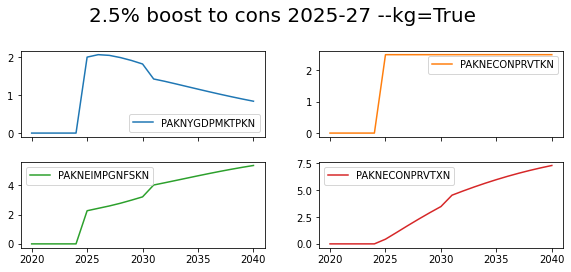

In [16]:
mpak.smpl() # reset the active sample period to the full model.
CTempExogAllKG=mpak.fix(bline,'PAKNECONPRVTKN')
CTempExogAllKG = CTempExogAllKG.upd('''
<2025 2027> PAKNECONPRVTKN_X * 1.025 --kg
''',lprint=0)

#Now we solve the model
CTempXAllResKG = mpak(CTempExogAllKG,2020,2040,keep='2.5% increase in C 2025-27 -- exog whole period --KG=True') # simulates the model 
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEIMPGNFSKN PAKNECONPRVTXN'].difpctlevel.mul100.plot(title="2.5% boost to cons 2025-27 --kg=True")


### Exogenize the variable only for the period during which it is shocked

This scenario introduces a subtle but import difference.  Here we the variable is again exogenized using the fix syntax. But this time it is exogonized only for the period where the variable is shocked.

This means that the consumption function will be de-activated for only three years (instead of the whole period as in the previous examples).  As a result, the values that consumption takes in 2028, 2029, ... 2040 depend on the model, not the level it was set to when exogenized (which was the case in the 3 previous versions).

Looking at the maths of the model the consumption equation is effectively split into two.

for the period before 2025 $cons_d=0$ and the consumption equation simplifies to:

$cons=C(X)$

for the period 2025-2028 it is exogenized ($cons_d=1$) so it simplifies to:

$cons=cons_x$

but in the final period 2028-2040 ($cons_d=0$) and the equation reverts to:

$cons=C(X)$



C:\Users\wb268970\.conda\envs\mf_pinned_developement_test\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.canvas.print_figure(bytes_io, **kw)


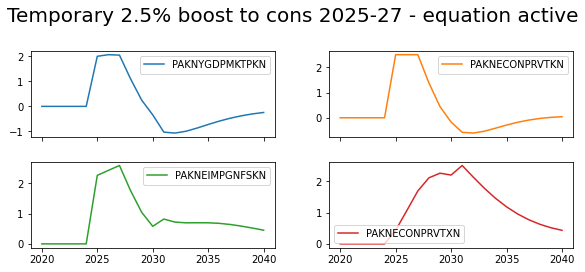

In [17]:
mpak.smpl() # reset the active sample period to the full model.
CExogTemp=mpak.fix(bline,'PAKNECONPRVTKN',2025,2027)                             #Consumption is exogenized only for three years 2025 2026 and 2027 PAKNECONPRVTKN_D=1 for 2025,2026, 2027 0 elsewhere.
CExogTemp = CExogTemp.upd('<2025 2027> PAKNECONPRVTKN_X * 1.025',lprint=0)       #In subsequent years it's level will be determined by the equation 

#Solve the model
CExogTempRes = mpak(CExogTemp,2020,2040,keep='2.5% increase in C 2025-27 -- temporarily exogenized') # simulates the model 
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEIMPGNFSKN PAKNECONPRVTXN'].difpctlevel.mul100.plot(title="Temporary 2.5% boost to cons 2025-27 - equation active")



These results have subtle differences compared with the previous.  The most obvious is visible in looking at the graph for Consumption.  Rather than reverting immediately to its earlier pre-shock level, it falls more gradually and actually overshoots (falls below its earlier level), before returning slowly to its pre-shock level.  That is because unlike in the previous shocks, its path is being determined endogenously and reacting to changes elsewhere in the model, notably changes to prices, wages and government spending as well as the lagged level of consumption.

In [18]:
print('Consumption base and shock levels\r\n');

print('Real values in 2030');
print(f'Base value:  {bline.loc[2028,"PAKNECONPRVTKN"]:,.0f}.\tShocked value: {CExogTempRes.loc[2028,"PAKNECONPRVTKN"]:,.0f}.\r\n'
    f'Percent difference: {round(100*((CExogTempRes.loc[2030,"PAKNECONPRVTKN"]-bline.loc[2028,"PAKNECONPRVTKN"])/bline.loc[2028,"PAKNECONPRVTKN"]),2)}')
print('\r\nReal values in 2040');
print(f'Base value:  {bline.loc[2040,"PAKNECONPRVTKN"]:,.0f}.\tShocked value: {CExogTempRes.loc[2040,"PAKNECONPRVTKN"]:,.0f}.\r\n'
    f'Percent difference: {round(100*((CExogTempRes.loc[2040,"PAKNECONPRVTKN"]-bline.loc[2040,"PAKNECONPRVTKN"])/bline.loc[2040,"PAKNECONPRVTKN"]),2)}')

Consumption base and shock levels

Real values in 2030
Base value:  27,241,278.	Shocked value: 27,616,949.
Percent difference: 5.36

Real values in 2040
Base value:  38,676,995.	Shocked value: 38,693,167.
Percent difference: 0.04


### Simulation with Add factors

Add factors are a crucial element of the macromodels of the World Bank and serve multiple purposes.

In simulation, add-factors allow simulations to be conducted **without** de-activating behavioural equations.  Such shocks are often referred to as **endogenous** shocks because the equation of the behavioural variable that is shocked remains  active throughout.

In some ways they are very similar to a temporary exogenous shock. Both ways of producing the shock allow the shocked variable to respond endogenously in the period after the shock.  The main difference between the two approaches is that:

 * **Endogenous** shocks (Add-Factor shocks) allow the shocked variable to respond to changed circumstances that occur during the period of the shock.
     * This approach makes most sense for "animal spirits", shocks where the underlying behaviour is expected to change.
     * It also makes sense when actions of one part of an aggregate is likely to impact behaviour of other sectors within an aggregate
     * increased investment by a particular sector would be an example here as the associated increase in activity is likely to increase investment incentives in other sectors, while increased demand for savings will increase interest rates and the cost of capital operating in the opposite direction.  
     * Sustained changes in behaviour, for example increased propensity to invest because of improved recognition 
     
 * **Exogenous** shocks to endogenous variables fix the level of the shocked variable during the shock period. 
     * Changes in government spending policy, something that is often largely an economically exogenous decision.
     
#### Simulating the impact of a planned investment

The below simulation uses the add-factor to simulate the impact of a 3 year investment  program beginning in 2025 of 1 percent of GDP per year, that is financed through an increase in foreign direct investment. This might reflect a specific large scale plant that is being constructed due to a deal reached by the government with a foreign manufacturer.  The add-factor approach is chosen because the additional investment is likely to increase demand for the products of other firms, which is likely to incite them to add to their investments as well.

##### How to translate the economic shock into a model shock

Add-factors in the ```MFMod``` framework are applied to the intercept of an equation (not the level of the dependent variable).  This preserves the estimated elasticities of the equation, but makes introduction of an add-factor shock somewhat more complicated than the exogenous approach.  Below a step-by-step how-to guide:

1. Identify numerical size of the shock
2. Examine the functional form of the equation, to determine the nature of the add factor.  If the equation is expressed as a:
    * **growth rate** then the add-factor will be an addition or subtraction to the growth rate
    * **percent of GDP (or some other level)** then the add-factor will be an addition or subtraction to the share of growth.
    * **Level** then the add-factor will be a direct addition to the level of the dependent variable
3. Convert the economic shock into the units of the add-factor
4. Shock the add-factor by the above amount and run the model
    * Note the add-factor is an exogenous variable in the model, so shocking it follows the well established process for shocking an exogenous variable.


 

##### Determine the size of shock

Above we identified the shock as to be a 1 percent of GDP increase in FDI that flows directly into private-sector investment.  A first step would be to determine the variables that need to be shocked (FDI) and private investment. To do this we can query the variable dictionary.



In [19]:
mpak['*NY*'].des

PAKNYGDPDISCCN            : PAKNYGDPDISCCN
PAKNYGDPDISCKN            : PAKNYGDPDISCKN
PAKNYGDPFCSTCN            : GDP Factor Cost Local Currency units Volumes National base year
PAKNYGDPFCSTKN            : GDP Factor Cost Local Currency units Volumes National base year
PAKNYGDPFCSTXN            : PAKNYGDPFCSTXN
PAKNYGDPFCSTXN_A          : Add factor:PAKNYGDPFCSTXN
PAKNYGDPFCSTXN_D          : Fix dummy:PAKNYGDPFCSTXN
PAKNYGDPFCSTXN_FITTED     : Fitted  value:PAKNYGDPFCSTXN
PAKNYGDPFCSTXN_X          : Fix value:PAKNYGDPFCSTXN
PAKNYGDPGAP_              : PAKNYGDPGAP_
PAKNYGDPMKTPCD            : PAKNYGDPMKTPCD
PAKNYGDPMKTPCN            : GDP, Market Prices, LCU mn
PAKNYGDPMKTPCN_VALUE_2010 : PAKNYGDPMKTPCN_VALUE_2010
PAKNYGDPMKTPKD            : PAKNYGDPMKTPKD
PAKNYGDPMKTPKN            : Real GDP
PAKNYGDPMKTPKN_VALUE_2010 : PAKNYGDPMKTPKN_VALUE_2010
PAKNYGDPMKTPXN            : PAKNYGDPMKTPXN
PAKNYGDPPOTLKN            : PAKNYGDPPOTLKN
PAKNYGDPTFP               : Total factor productivity
PAK

##### Identify the functional form(s)

To understand how to shock using the add factor, it is essential to understand how the add-factor enters into the equation. 

|Addfactor is on the intercept of|Shock needs to be calculated as|
|:--|:--|
|a growth equation|a change in th growth rate|
|Share of GDP|a percent of GDP |
|Level| as change in the level|

Use the .eviews command or .original command to identify the functional forms if the equation to be shocked.

In [20]:
# This needs to be rewritten to use the eviews expression when published
mpak['PAKNEGDIFPRVKN'].frml


PAKNEGDIFPRVKN : FRML <Z,EXO> PAKNEGDIFPRVKN = (PAKNEGDIFPRVKN_A*PAKNEGDIKSTKKN(-1)+ (0.00212272413966296+0.970234989019907*(PAKNEGDIFPRVKN(-1)/PAKNEGDIKSTKKN(-2))+(1-0.970234989019907)*(((LOG(PAKNYGDPPOTLKN))-(LOG(PAKNYGDPPOTLKN(-1))))+PAKDEPR)+0.0525240494260597*((LOG(PAKNEKRTTOTLCN/PAKNYGDPFCSTXN))-(LOG(PAKNEKRTTOTLCN(-1)/PAKNYGDPFCSTXN(-1))))) *PAKNEGDIKSTKKN(-1)) * (1-PAKNEGDIFPRVKN_D)+ PAKNEGDIFPRVKN_X*PAKNEGDIFPRVKN_D $


##### Calculate the size of the required add factor shock

The shock to be executed is 0.5 percent of GDP.

It is assumed that the financing will come from FDI and that all the money will be spent in one year on private investment.

The private investment equation is written as a share of the capital stock.  Therefore, the add-factor needs to be shocked by adding 1 percent of GDP to private investment in 2028 divided by the capital stock in 2028.




In [53]:
#Create a DataFrame AFShock that is equal tothe baseline
AFShock=bline

#Display the level of the AF
print("Pre shock levels")
AFShock.loc[2025:2030,['PAKNEGDIFPRVKN_A','PAKNEGDIFPRVKN','PAKNEGDIKSTKKN']]

#print(AFShock.loc[2025:2030,'PAKNEGDIFPRVKN']/AFShock.loc[2025:2030,'PAKNYGDPMKTPKN']*100)


Pre shock levels


,PAKNEGDIFPRVKN_A,PAKNEGDIFPRVKN,PAKNEGDIKSTKKN
2025,-0.000458,1.602854e+06,4.730392e+07
2026,-0.000389,1.581104e+06,4.814879e+07
2027,-0.000331,1.569541e+06,4.900980e+07
2028,-0.000281,1.569141e+06,4.989869e+07
2029,-0.000239,1.580577e+06,5.082694e+07
2030,-0.000203,1.604394e+06,5.180590e+07


Below the mfcalc routine is used to set the addfactor variable equal to its previous value plus the equivalent of 1 percent of GDP when expressed as a percent of the previous period's level of private investment.

In [54]:
AFShock=AFShock.mfcalc("<2028 2028> PAKNEGDIFPRVKN_A = PAKNEGDIFPRVKN_A + (.01*PAKNYGDPMKTPKN/PAKNEGDIKSTKKN)");

print("Post shock levels")
AFShock.loc[2025:2030,'PAKNEGDIFPRVKN_A']

Post shock levels


2025   -0.000458
2026   -0.000389
2027   -0.000331
2028    0.005774
2029   -0.000239
2030   -0.000203
Name: PAKNEGDIFPRVKN_A, dtype: float64

##### Run the shock

C:\Users\wb268970\.conda\envs\mf_pinned_developement_test\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.canvas.print_figure(bytes_io, **kw)


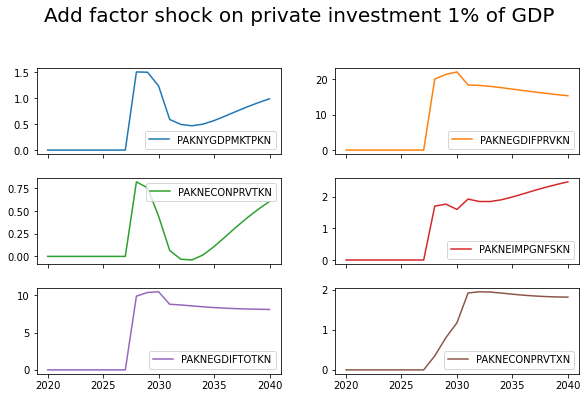

In [56]:
AFShockRes = mpak(AFShock,2020,2040,keep='1% of GDP increase in FDI and private investment (AF shock)')
mpak['PAKNYGDPMKTPKN PAKNEGDIFPRVKN PAKNECONPRVTKN PAKNEIMPGNFSKN PAKNEGDIFTOTKN PAKNECONPRVTXN'].difpctlevel.mul100.plot(title="Add factor shock on private investment 1% of GDP")


# Report writing and scenario results

`ModelFlow`, standard pandas routines and other python libraries like `Matplotlib` and `Plotly` can be used to visualize and compare dataframes and therefore the results, from scenarios -- as indeed has been done in the preceding paragraphs. 

In addition, `ModelFlow` also provides several specific routines that make such comparisons easier. 

## The Keep option

The **Keep** option facilitates the comparison of results from different scenarios run on a give model object.  In each of the simulations executed above, the `keep` option was activated. This causes the results from each simulation in a unique `DataFrame` that can be identified by the descriptor given to it.  


### The `.keep_plot()` method

For example the keep_plot method can be used to plot the value, growth rate or percent change in levels of different values across from each of the kept solutions.


#### Differences of growth rates 

For example below we have graphs of the growth rates of GDP, Consumption and Imports from the four scenarios that we have run.

In [24]:
mpak.keep_plot('PAKNYGDPMKTPCN PAKNECONPRVTKN PAKNEIMPGNFSKN', diff=1,showtype='growth', legend=True)


{'PAKNYGDPMKTPCN': <Figure size 720x432 with 1 Axes>,
 'PAKNECONPRVTKN': <Figure size 720x432 with 1 Axes>,
 'PAKNEIMPGNFSKN': <Figure size 720x432 with 1 Axes>}

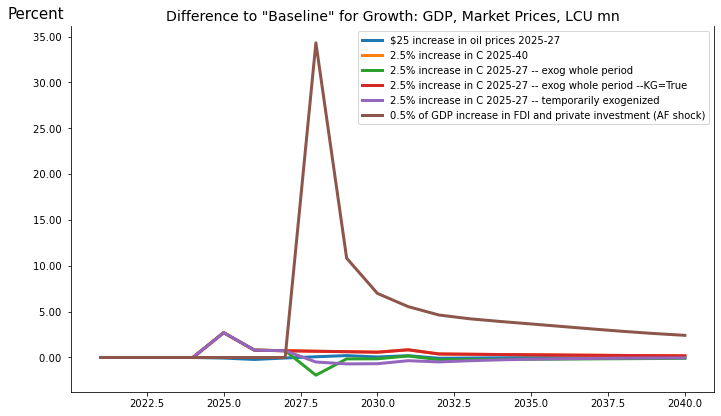

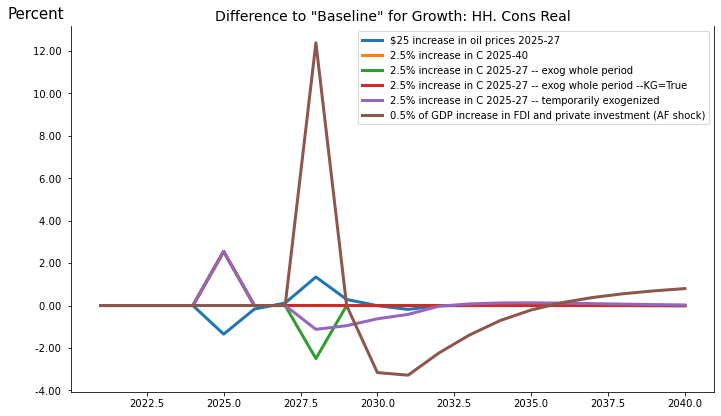

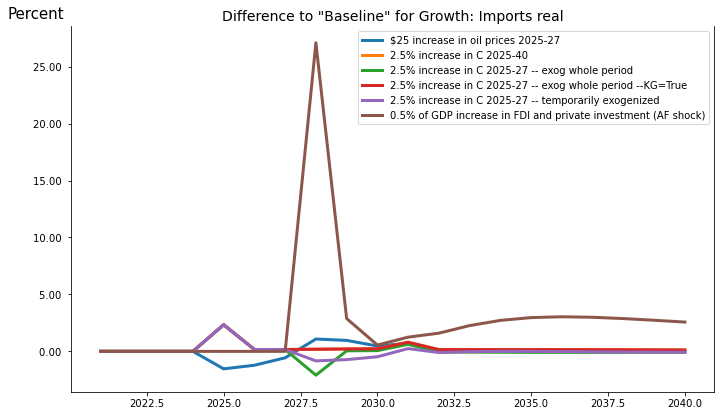

{'PAKNYGDPMKTPCN': <Figure size 720x432 with 1 Axes>,
 'PAKNECONPRVTKN': <Figure size 720x432 with 1 Axes>,
 'PAKNEIMPGNFSKN': <Figure size 720x432 with 1 Axes>}

In [33]:
mpak.keep_plot('PAKNYGDPMKTPCN PAKNECONPRVTKN PAKNEIMPGNFSKN', diff=1,showtype='growth',legend="Change in growth rates",showfig=True)


#### Differences in percent of baseline values

In this plot, the same results are presented, but as percent deviations from the baseline values of the displayed data.

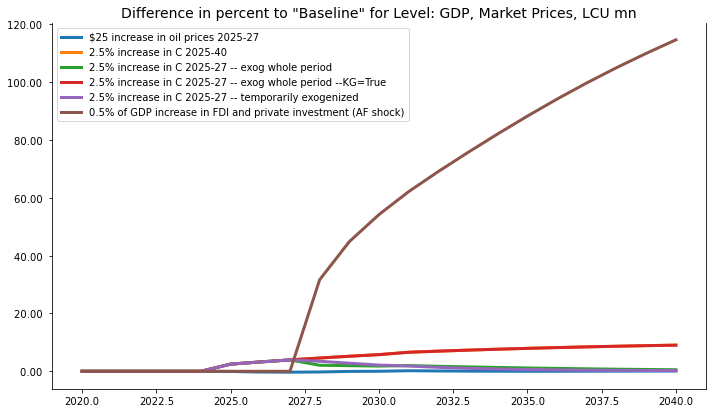

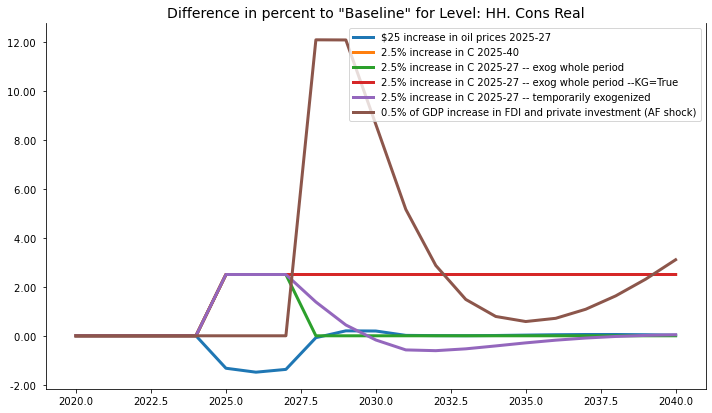

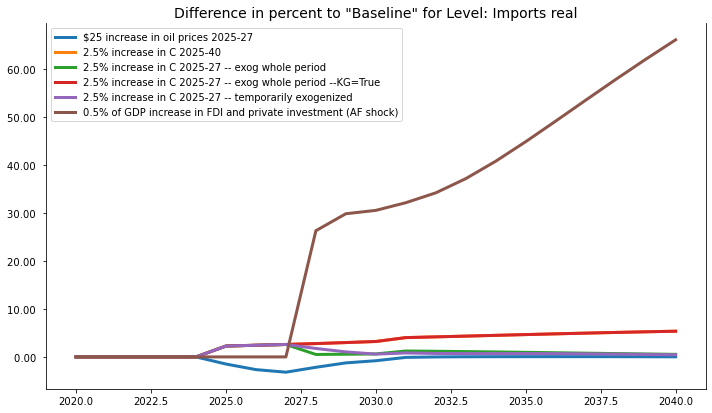

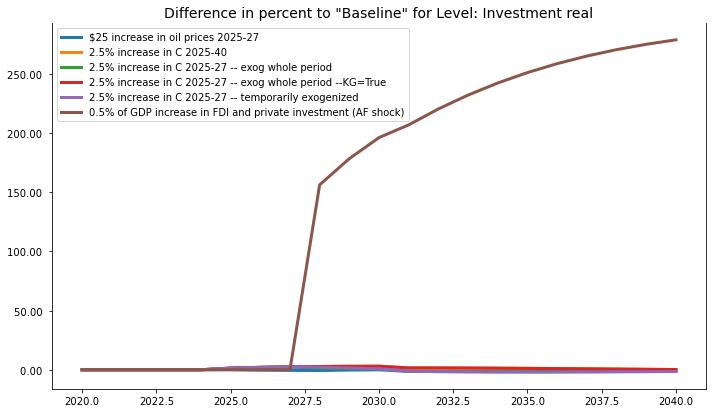

{'PAKNYGDPMKTPCN': <Figure size 720x432 with 1 Axes>,
 'PAKNECONPRVTKN': <Figure size 720x432 with 1 Axes>,
 'PAKNEIMPGNFSKN': <Figure size 720x432 with 1 Axes>,
 'PAKNEGDIFTOTKN': <Figure size 720x432 with 1 Axes>}

In [37]:
mpak.keep_plot('PAKNYGDPMKTPCN PAKNECONPRVTKN PAKNEIMPGNFSKN PAKNEGDIFTOTKN', diffpct=1,showtype='level', legend=True,showfig=True)




### Some variations on keep_plot(

The **variables** we want to be displayed is listed as first argument. Variable names can include 
wildcards (using * for any string and ? for any character) 

**Transformation of data displayed:** 

| showtype= |Use this operator|
| :- | :---|
 'level' (default)|No transformation  
 'growth'| The growth rate  in percent 
 'change'| The yearly change ($\Delta$) 

**legend placement**

| legend= |Use this operator|
| :- | :---|
 False (default) |The legends are  placed at the end of the corresponding line
 True|The legends are places in a legend box


Often it is useful to compare the scenario results with the baseline result. This is done with the diff argument. 

| diff= |Use this operator|
| :- | :---|
 False (default) |All entries in the keep_solution dictionary is displayed
 True|The difference to the first entry is shown.

It can also be useful to compare the scenario results with the baseline result **measured in percent**. This is done with the diffpct argument. 

| diffpct= |Use this operator|
| :- | :---|
 False (default) |All entries in the keep_solution dictionary is displayed
 True|The difference in percent to the first entry is shown
 
 
 ```savefig='[path/]<prefix>.<extension>'```
 Will create a number of files with the charts.<br>
 The files will be saved location with name ```<path>/<prefix><variable name>.<extension>``` <br>The extension determines the 
 format of the saved file: ```pdf```, ```svg``` and ```png``` are the most common extensions. 

In [25]:
mpak.fix_dummy_fixed

[]

In [24]:
mpak['PAKNYGDPMKTPCN PAKNYGDPMKTPKN PAKGGEXPTOTLCN PAKGGREVTOTLCN PAKNECONGOVTKN']

In [26]:
mpak.keep_solutions.keys()


dict_keys(['Baseline', '$25 increase in oil prices 2025-27', '2.5% increase in C 2025-40', '2.5% increase in C 2025-27 -- exog whole period', '2.5% increase in C 2025-27 -- exog whole period --KG=True', '2.5% increase in C 2025-27 -- temporarily exogenized', '0.5% of GDP increase in FDI and private investment (AF shock)'])

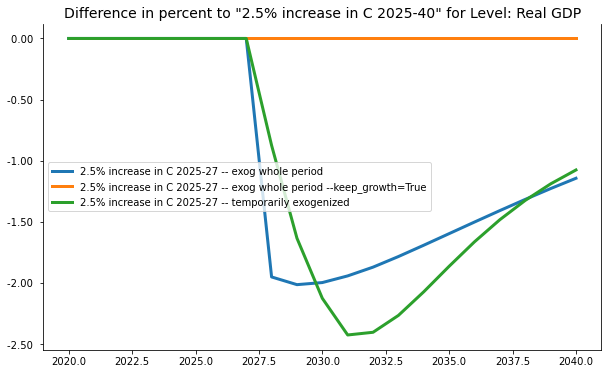

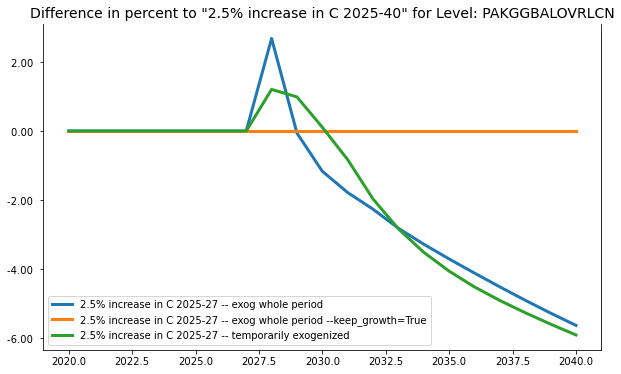

In [28]:
with mpak.keepswitch(scenarios='2.5% increase in C 2025-40|2.5% increase in C 2025-27 -- exog whole period|2.5% increase in C 2025-27 -- exog whole period --KG=True|2.5% increase in C 2025-27 -- temporarily exogenized'):
    mpak.keep_plot('PAKNYGDPMKTPKN PAKGGBALOVRLCN PAKGGDEBTTOTLCN',diffpct=1,showtype='level',legend=True);

In [51]:
mpak.keep_plot(help)


AttributeError: '_Helper' object has no attribute 'split'